Methods implementing convolution and FFT 

In [95]:
import cv2
import numpy as np
import time
import matplotlib.pyplot as plt
import matplotlib.patches as patches

In [175]:
def scale_image(image, alpha=1):
    # Get dimensions of the original image
    height, width = image.shape[:2]
    # Scale width and height using alpha parameter
    new_height = int(height * alpha)
    new_width = int(width * alpha)
    # Resize the image using cv2.resize()
    scaled_image = cv2.resize(image, (new_width, new_height))
    return scaled_image

In [200]:
import numpy as np

def conv2d_crosscorrelation_coeff(image, kernel, strides = 1):
    x_img_shape, y_img_shape = image.shape
    x_kern_shape, y_kern_shape = kernel.shape
    xOutput = int(((x_img_shape - x_kern_shape ) / strides) + 1)
    yOutput = int(((y_img_shape - y_kern_shape ) / strides) + 1)
    output = np.zeros((xOutput, yOutput))

    mean_kernel = np.mean(kernel)
    std_kernel = np.std(kernel)
    
    for y in range(image.shape[1]):
        if y > image.shape[1] - y_kern_shape:
            break
        for x in range(image.shape[0]):
            if x > image.shape[0] - x_kern_shape:
                break
            img_slice = image[x:x+x_kern_shape, y:y+y_kern_shape]
            
            mean_img_slice = np.mean(img_slice)
            std_img_slice = np.std(img_slice)
            #coeff = np.sum((img_slice - mean_img_slice) * (kernel - mean_kernel)) / (std_img_slice * std_kernel)
            if std_img_slice > 1e-6 and std_kernel > 1e-6:
                coeff = np.sum((img_slice - mean_img_slice) * (kernel - mean_kernel)) / (std_img_slice * std_kernel)
            else:
                coeff = 0
            
            #output[x,y] = (kernel * img_slice).sum()
            output[x,y] = coeff
    return output

def find_waldo_convolution(image, template, image_name=""):
    result = conv2d_crosscorrelation_coeff(image, template)
    max_loc = np.unravel_index(np.argmax(result), result.shape)
    waldo_location_fft = max_loc
    h, w = template.shape
    top_left = waldo_location_fft[::-1]
    bottom_right = (top_left[0] + w, top_left[1] + h)
    print(top_left, bottom_right)
    cv2.rectangle(image,top_left, bottom_right, (0, 255, 0), 3)
    cv2.imwrite(f"results/conv/found_waldo_conv{image_name}.png", image)




In [157]:
result.shape

(1203, 2012)

In [163]:
np.unravel_index(np.argmax(result), result.shape)

(521, 82)

(1530, 460)


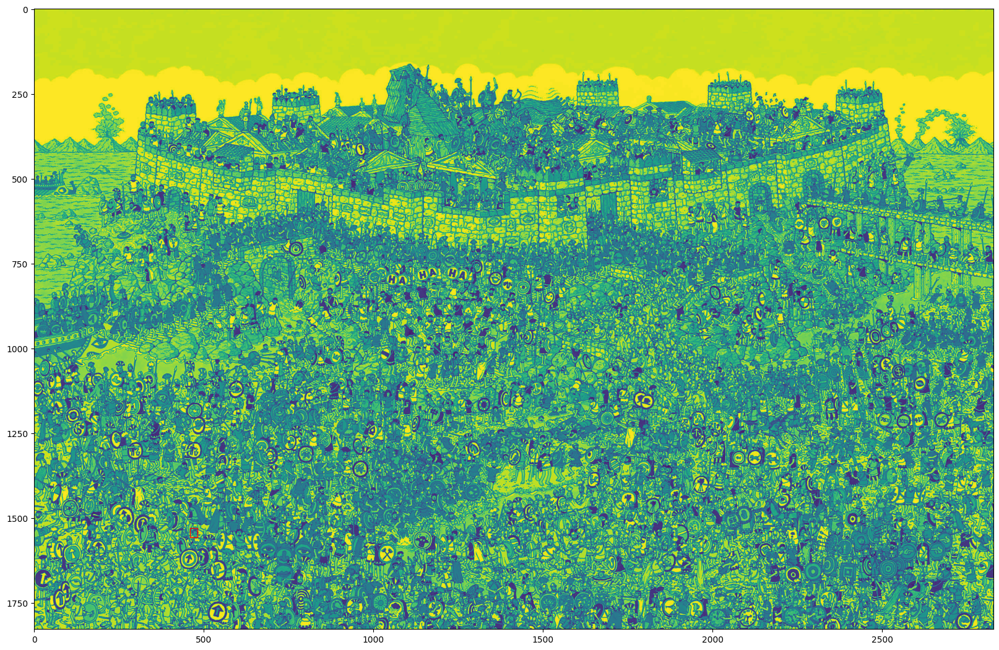

In [201]:
# TESTING THE CONVOLUTION

image_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/images/11.jpg"
template_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/template/11.jpg_template.jpg"
main_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
template_image = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)

result = conv2d_crosscorrelation_coeff(main_image, template_image)

max_loc = np.unravel_index(np.argmax(result), result.shape)

waldo_location_fft = max_loc
print(waldo_location_fft)
h, w = template_image.shape
location = waldo_location_fft[::-1]

fig, ax = plt.subplots(figsize=(20, 18))
ax.imshow(main_image)
rect = patches.Rectangle(location, template_image.shape[1], template_image.shape[0], linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)
plt.show()


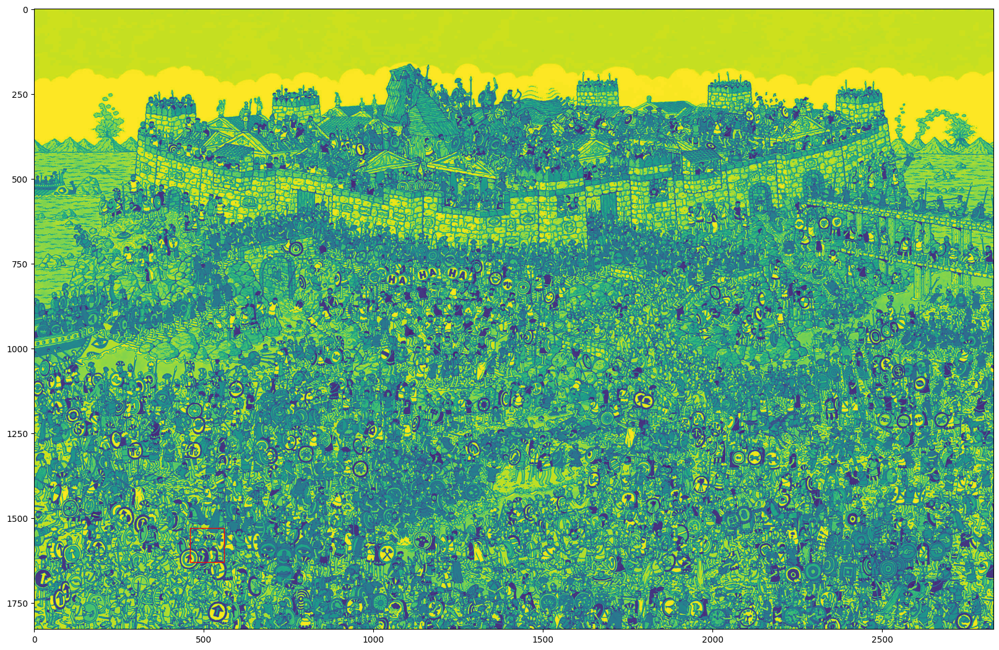

In [202]:
fig, ax = plt.subplots(figsize=(20, 18))
ax.imshow(main_image)
rect = patches.Rectangle(location, 100, 100, linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)
plt.show()

In [204]:
'''
def find_waldo_convolution(image, template, image_name=""):
    method = cv2.TM_CCOEFF_NORMED
    res = cv2.matchTemplate(image, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    h, w = template.shape
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv2.rectangle(image,top_left, bottom_right, (0, 255, 0), 3)
    cv2.imwrite(f"results/conv/found_waldo_conv{image_name}.png", image)
'''
def find_waldo_fft(image, template, image_name=""):
    # Perform FFT on both the main image and the template
    image_fft = np.fft.fft2(image)
    template_fft = np.fft.fft2(template, s=image_fft.shape)

    corr_fft = np.real(np.fft.ifft2((image_fft * np.conj(template_fft))/ np.abs(image_fft*np.conj(template_fft))))
    # Find the location with the maximum correlation coefficient
    max_loc = np.unravel_index(np.argmax(corr_fft), corr_fft.shape)

    waldo_location_fft = max_loc

    h, w = template.shape
    top_left = waldo_location_fft[::-1]
    bottom_right = (top_left[0] + w, top_left[1] + h)
    cv2.rectangle(image,top_left, bottom_right, (0, 255, 0), 3)


    fig, ax = plt.subplots(figsize=(20, 18))
    ax.imshow(main_image)
    rect = patches.Rectangle(top_left, template_image.shape[1], template_image.shape[0], linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    plt.show()
    # Save the result image
    cv2.imwrite(f"results/fft/found_waldo_fft_{image_name}.png", image)



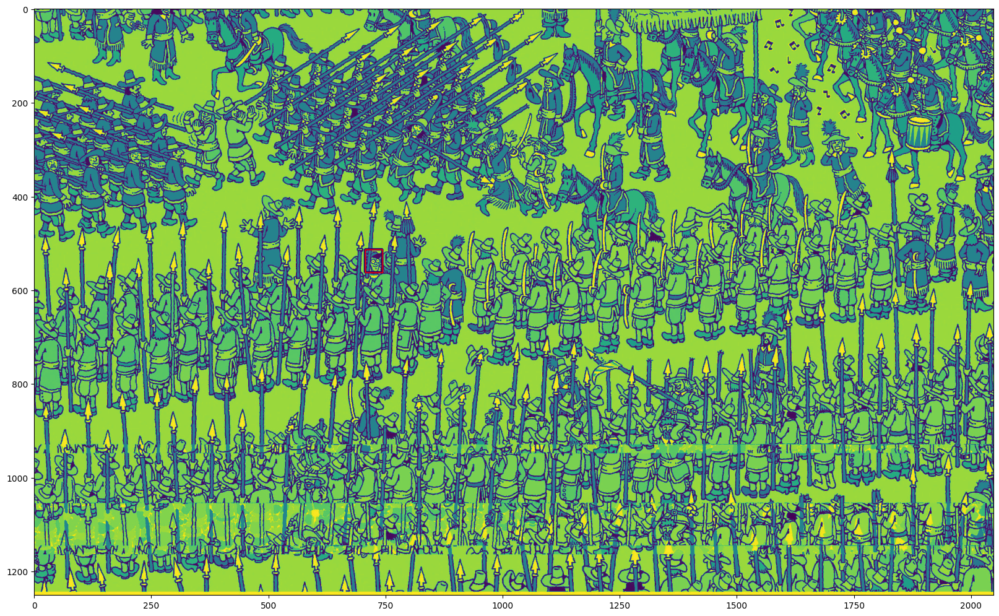

AttributeError: 'NoneType' object has no attribute 'shape'

In [206]:
image_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/images/1.jpg"
template_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/template/1.jpg_template.jpg"
main_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
template_image = cv2.imread(template_path, cv2.IMREAD_GRAYSCALE)

result = find_waldo_fft(main_image, template_image, image_name="1")

max_loc = np.unravel_index(np.argmax(result), result.shape)

waldo_location_fft = max_loc
print(waldo_location_fft)
h, w = template_image.shape
location = waldo_location_fft[::-1]

fig, ax = plt.subplots(figsize=(20, 18))
ax.imshow(main_image)
rect = patches.Rectangle(location, template_image.shape[1], template_image.shape[0], linewidth=1, edgecolor='r', facecolor='none')
ax.add_patch(rect)
plt.show()

Evaluation methods of conv and fft

In [172]:
def evaluate_waldo_conv(main_image_path, template_image_path, image_name="", scaling_factor = 1):
    # Load the main image and the template image
    main_image = cv2.imread(main_image_path, cv2.IMREAD_GRAYSCALE)
    template_image = cv2.imread(template_image_path, cv2.IMREAD_GRAYSCALE)
    
    template_image = scale_image(template_image, scaling_factor)
    # Measure execution time for find_waldo_convolution
    find_waldo_convolution(main_image, template_image, image_name)
    

def evaluate_waldo_fft(main_image_path, template_image_path, image_name="", scaling_factor=1):
    main_image = cv2.imread(main_image_path, cv2.IMREAD_GRAYSCALE)
    template_image = cv2.imread(template_image_path, cv2.IMREAD_GRAYSCALE)
    template_image = scale_image(template_image, scaling_factor)
    find_waldo_fft(main_image, template_image, image_name)

#

In [173]:
image_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/images/"
template_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/template/"

start_time = time.time()
for n in range(1, 37):
    evaluate_waldo_conv(image_path+str(n)+".jpg", template_path+str(n)+".jpg_template.jpg", str(n), scaling_factor=0.8)
    end_time = time.time() - start_time
print("Execution time =", end_time)

(1536, 869) (1565, 908)
(82, 521) (102, 547)
(868, 799) (893, 828)


/var/folders/3q/ldkqkq893hg7gbtxzm7fl_mr0000gn/T/ipykernel_22357/708573899.py:22: RuntimeWarning: invalid value encountered in scalar divide
  coeff = np.sum((img_slice - mean_img_slice) * (template_image - mean_kernel)) / (std_img_slice * std_kernel)


(1928, 0) (1946, 21)
(273, 165) (297, 197)
(880, 1152) (911, 1187)
(1445, 102) (1473, 140)
(472, 104) (543, 181)
(840, 592) (864, 619)
(352, 64) (396, 113)
(136, 0) (153, 21)
(1089, 897) (1114, 933)
(475, 57) (483, 68)
(453, 612) (485, 644)
(1575, 829) (1586, 842)
(0, 0) (467, 504)
(104, 0) (120, 24)
(1565, 405) (1589, 433)
(299, 79) (309, 92)
(2728, 376) (2760, 416)
(1992, 688) (2015, 713)
(799, 363) (810, 375)
(72, 0) (86, 21)
(433, 757) (447, 773)
(368, 199) (378, 211)
(484, 415) (500, 431)
(576, 664) (592, 683)
(388, 540) (398, 552)
(608, 425) (622, 443)
(789, 270) (801, 286)
(0, 0) (31, 37)
(32, 0) (64, 40)
(0, 0) (135, 140)
(0, 0) (92, 104)
(382, 296) (554, 464)
(0, 0) (9, 7)
Execution time = 1274.6982729434967


In [25]:
image_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/images/"
template_path = "/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/template/"
start_time = time.time()
for n in range(1, 37):
    evaluate_waldo_fft(image_path+str(n)+".jpg", template_path+str(n)+".jpg_template.jpg", str(n), scaling_factor=1)
    end_time = time.time() - start_time
print("Execution time =", end_time)

Execution time = 9.223401069641113


Accuarcy of images when it is scaled up

In [53]:
import cv2
import numpy as np

# Load the main color image
#img_rgb = cv2.imread('/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/Waldo/original-images/3.jpg')
img_rgb = cv2.imread('/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/images/6.jpg')
# Load the color template image
#template = cv2.imread('/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/Waldo/64/waldo/7_12_5.jpg')
template = cv2.imread('/Users/rakeshrathod/Desktop/Numerical_Analysis/MiniProject1/template/6.jpg_template.jpg')
# Define the method for template matching
Methods = ['cv2.TM_CCOEFF', 'cv2.TM_CCOEFF_NORMED', 'cv2.TM_CCORR',
            'cv2.TM_CCORR_NORMED', 'cv2.TM_SQDIFF', 'cv2.TM_SQDIFF_NORMED']
#method = cv2.TM_CCOEFF_NORMED
method = cv2.TM_CCOEFF_NORMED
# Apply template matching
res = cv2.matchTemplate(img_rgb, template, method)

# Set a threshold to filter out weak matches
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
else:
    top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)

cv2.rectangle(img_rgb,top_left, bottom_right, (0, 255, 0), 3)
# Find locations where the match exceeds the threshold
'''
loc = np.where(res >= threshold)
print(loc)
# Draw rectangles around the detected locations
for pt in zip(*loc[::-1]):
    # Draw a green rectangle with a thickness of 3
    bottom_right = (pt[0] + template.shape[1], pt[1] + template.shape[0])
    cv2.rectangle(img_rgb, pt, bottom_right, (0, 255, 0), 3)
'''
# Save the result image
cv2.imwrite('found_waldo.png', img_rgb)


True

In [ ]:
def conv_match_template(image, template):
    # Get dimensions of image and template
    image_height, image_width = image.shape
    template_height, template_width = template.shape
    
    # Initialize result matrix
    result_height = image_height - template_height + 1
    result_width = image_width - template_width + 1
    result = np.zeros((result_height, result_width))
    
    # Iterate over image to perform convolution
    for y in range(result_height):
        for x in range(result_width):
            # Extract region from image
            region = image[y:y+template_height, x:x+template_width]
            # Compute correlation between region and template
            correlation = np.sum(region * template)
            # Store result in result matrix
            result[y, x] = correlation
    
    return result